In [1]:
import numpy as np
np.set_printoptions(suppress=True)
%matplotlib inline
import matplotlib.pyplot as plt
import cv2

In [2]:
import glob
img_names = glob.glob("datas/*")
for img_name in img_names:
    img = cv2.imread(img_name, -1)
    print(img.shape)

(1024, 390)
(9627, 3702)
(9732, 3741)
(9637, 3761)
(9724, 3770)
(1024, 391)
(1024, 395)
(9646, 3781)
(9629, 3714)
(1024, 396)
(9715, 3741)
(9812, 3819)
(9627, 3741)


(9715, 3741)


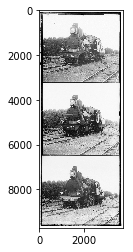

In [3]:
img = cv2.imread("datas/melons.tif", -1)
# img = cv2.imread("datas/onion_church.tif", -1)

img = cv2.imread("datas/train.tif", -1)
img = img / img.max()
m, n = img.shape
print(img.shape)
plt.imshow(img, cmap='gray') # BGR
plt.show()

In [4]:
def shift_image(X, sx, sy):
    X = np.roll(X, sy, axis=0)
    X = np.roll(X, sx, axis=1)
    if sy>0:
        X[:sy, :] = 0
    elif sy<0:
        X[sy:, :] = 0
    if sx>0:
        X[:, :sx] = 0
    elif sx<0:
        X[:, sx:] = 0
    return X

def devide_bgr(img):
    m,n = img.shape
    n_rows = int(m//3)

    img_b = img[:n_rows]
    img_g = img[n_rows:n_rows*2]
    img_r = img[n_rows*2:n_rows*3]
    return img_b, img_g, img_r

def align_bgr(img_b, img_g, img_r):
    m, n = img_b.shape
    img_color = np.zeros((m,n,3))
    img_color[:,:,0] = img_r
    img_color[:,:,1] = img_g
    img_color[:,:,2] = img_b
    return img_color

def SSD(img_1, img_2, boundary_cropping=False):
    if img_1.shape != img_2.shape:
        raise Exception('Different shape %s, %s'%(img_1.shape, img_2.shape))
    diff = img_1 - img_2
    if boundary_cropping:
        m, n = diff.shape
        cy = int(m//10)
        cx = int(n//10)
        diff[:cy, :cx] = 0
        diff[:cy, -cx:]= 0
        diff[-cy:, :cx] = 0
        diff[-cy:, -cx:] = 0
        
    return np.sum(diff*diff)



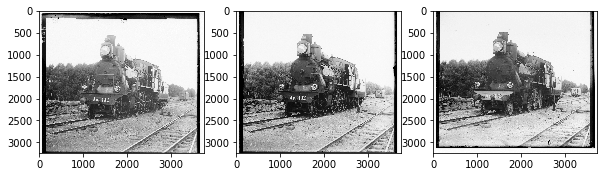

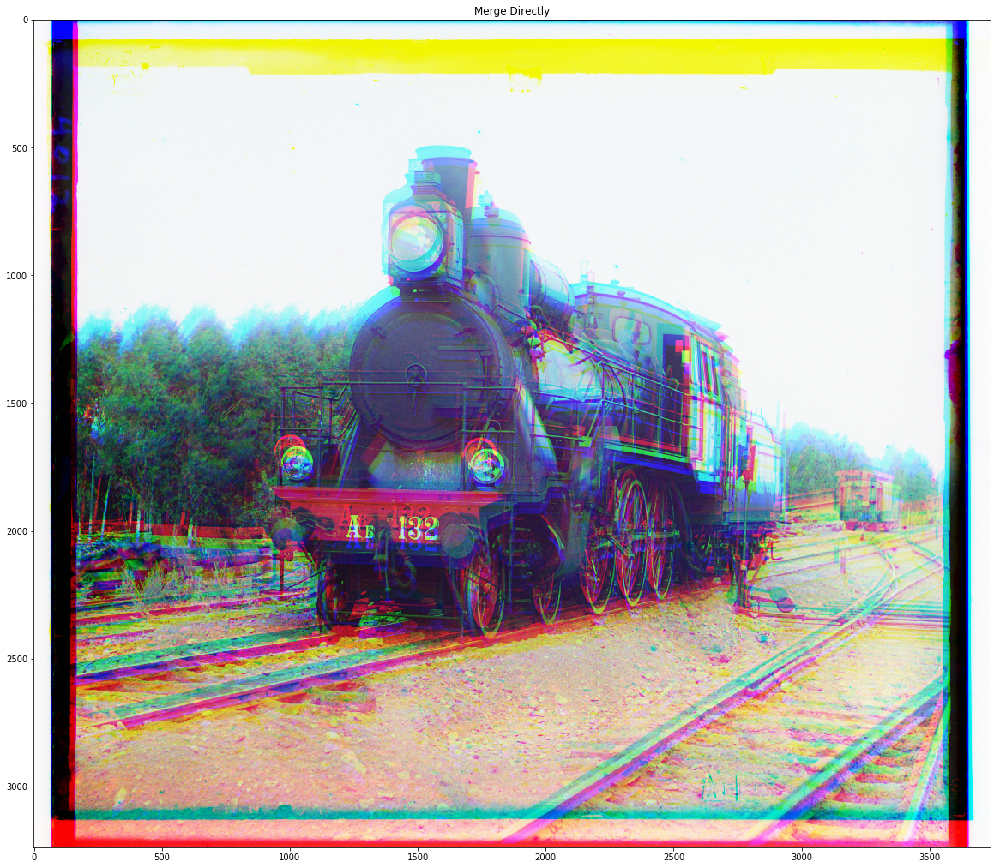

In [5]:
img_b, img_g, img_r = devide_bgr(img)
plt.figure(figsize=(10,10))
plt.subplot(131), plt.imshow(img_b, cmap='gray')
plt.subplot(132), plt.imshow(img_g, cmap='gray')
plt.subplot(133), plt.imshow(img_r, cmap='gray')
plt.show()

plt.figure(figsize=(20,20))
img_color = align_bgr(img_b, img_g, img_r)
plt.title('Merge Directly'), plt.imshow(img_color)
plt.show()

In [7]:
def align_bgr(img_b, img_g, img_r, align_vec_g=(0,0), align_vec_r=(0, 0)):
    m, n = img_b.shape
    img_g_shift = shift_image(img_g, align_vec_g[0],  align_vec_g[1])
    img_r_shift = shift_image(img_r, align_vec_r[0],  align_vec_r[1])
    img_color = np.zeros((m,n,3))
    img_color[:,:,0] = img_r_shift
    img_color[:,:,1] = img_g_shift
    img_color[:,:,2] = img_b
    return img_color

In [8]:
def find_best_align(img_0, img_1, range_x, range_y):
    min_ssd = 1e+10
    for sx in range_x:
        for sy in range_y:
            img_1_shift = shift_image(img_1, sx, sy)
            ssd = SSD(img_0, img_1_shift)
            if ssd < min_ssd:
                min_ssd = ssd  
                align_vec = (sx, sy)
    return align_vec

def find_best_align_2(img_a, img_b, img_1, range_x, range_y):
    min_ssd = 1e+10
    for sx in range_x:
        for sy in range_y:
            img_1_shift = shift_image(img_1, sx, sy)
            ssd_a = SSD(img_a, img_1_shift)
            ssd_b = SSD(img_b, img_1_shift)
            if ssd_a + ssd_b < min_ssd:
                min_ssd = ssd_a+ssd_b  
                align_vec = (sx, sy)
    return align_vec

def remove_boundary(img_color, align_vec_g, align_vec_r):
    gx, gy = align_vec_g
    rx, ry = align_vec_r
    bx = max(gx, -gx, rx, -rx, 1)
    by = max(gy, -gy, ry, -ry, 1)
    img_crop =  img_color[by:-by, bx:-bx, :]
    return img_crop

green: (0, 0)	red: (0, 4)
green: (0, 0)	red: (0, 8)
green: (0, 0)	red: (0, 15)
green: (0, 0)	red: (0, 32)
green: (0, 0)	red: (0, 65)
green: (0, 0)	red: (0, 129)


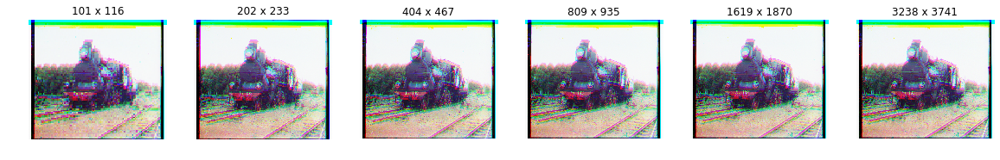

In [9]:
def high_res_colorize(img):
    pass

downsample_size = [32, 16, 8, 4, 2, 1]
m, n = img.shape
win_size = 30


win_sizes = [10, 8, 6, 4, 2, 2]


range_x_g = range(-win_size, win_size+1)
range_y_g = range(-win_size, win_size+1)
range_x_r = range(-win_size, win_size+1)
range_y_r = range(-win_size, win_size+1)

align_vec_g = (0,0)
align_vec_r = (0,0)
plt.figure(figsize=(20,10))

for i, s in enumerate(downsample_size):
    sm, sn = int(m//s),int(n//s)
    win_size = win_sizes[i]
    img_down = cv2.resize(img, (sn,sm))
    img_b, img_g, img_r = devide_bgr(img_down)
    
    # Align G
    align_vec_g = find_best_align(img_b, img_g, range_x_g, range_y_g)
    print("green:", align_vec_g, end='\t')
    range_x_g = range(align_vec_g[0]*2-win_size, align_vec_g[0]*2+win_size+1)
    range_y_g = range(align_vec_g[1]*2-win_size, align_vec_g[1]*2+win_size+1)
    
    # Align R 
    img_g_shift = shift_image(img_g, align_vec_g[0], align_vec_g[1])
    align_vec_r = find_best_align(img_b, img_r, range_x_r, range_y_r)
    #align_vec_r = find_best_align_2(img_b, img_g_shift, img_r, range_x_r, range_y_r)
    print("red:", align_vec_r)
    range_x_r = range(align_vec_r[0]*2-win_size, align_vec_r[0]*2+win_size+1)
    range_y_r = range(align_vec_r[1]*2-win_size, align_vec_r[1]*2+win_size+1)    
    
    img_color = align_bgr(img_b, img_g, img_r, align_vec_g, align_vec_r)
    m_, n_ = img_b.shape
    plt.subplot(1, len(downsample_size), i+1), plt.title('%d x %d'%(m_ ,n_)), 
    plt.axis('off'), plt.imshow(img_color)
plt.show()

In [12]:
def refine(img_b, img_g_shift, img_r_shift):
    m, n = img_b.shape
    img_b_c = img_b[int(m//2)-50:int(m//2)+50, int(n//2)-50:int(n//2)+50]
    img_g_c = img_g_shift[int(m//2)-50:int(m//2)+50, int(n//2)-50:int(n//2)+50]
    img_r_c = img_r_shift[int(m//2)-50:int(m//2)+50, int(n//2)-50:int(n//2)+50]
    range_ = range(-30, 30)
    refine_vec_g = find_best_align(img_b_c, img_g_c, range_, range_)
    refine_vec_r = find_best_align(img_b_c, img_r_c, range_, range_)
    return refine_vec_g, refine_vec_r

In [15]:
img_g_shift = shift_image(img_g, align_vec_g[0], align_vec_g[1])
img_r_shift = shift_image(img_r, align_vec_r[0], align_vec_r[1])

refine(img_b, img_g_shift, img_r_shift)
print(align_vec_g)
print(align_vec_r)

(0, 0)
(0, 129)


In [ ]:
Green: (42, 5) 
Red: (87, 30)

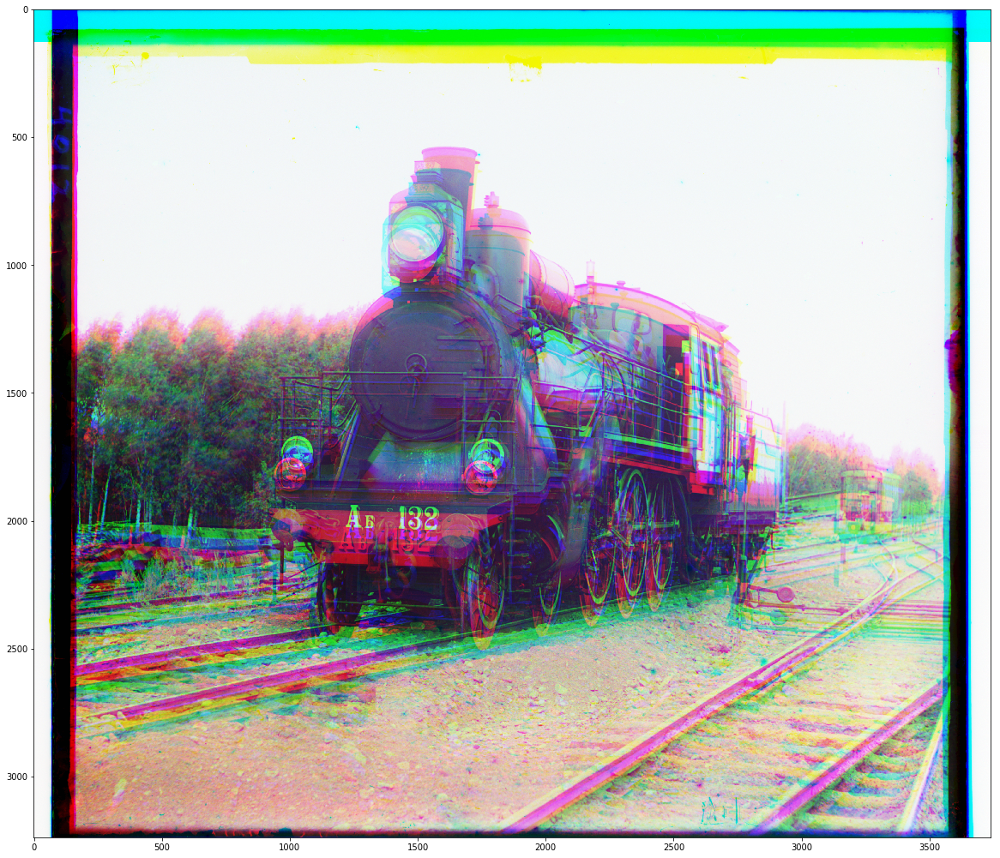

In [14]:
img_b, img_g, img_r = devide_bgr(img)
img_color = align_bgr(img_b, img_g, img_r, align_vec_g, align_vec_r)
plt.figure(figsize=(20,20))
plt.imshow(img_color/img_color.max())

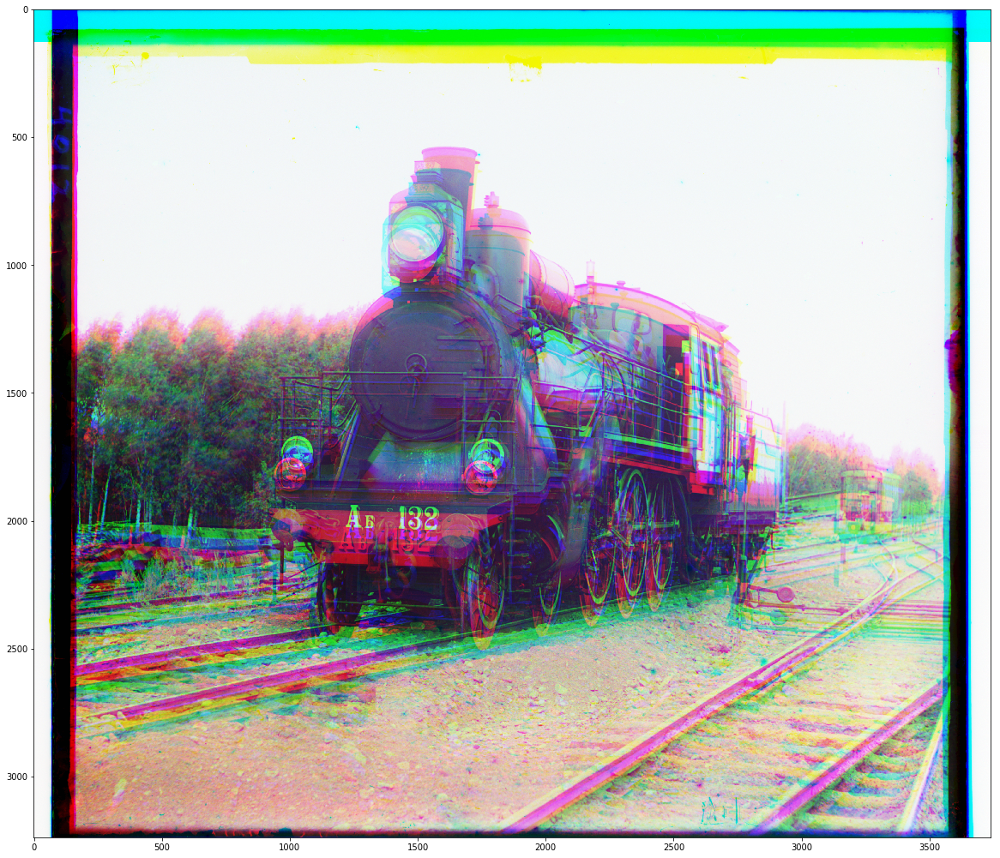

In [10]:
plt.figure(figsize=(20,20))
plt.imshow(img_color/img_color.max())

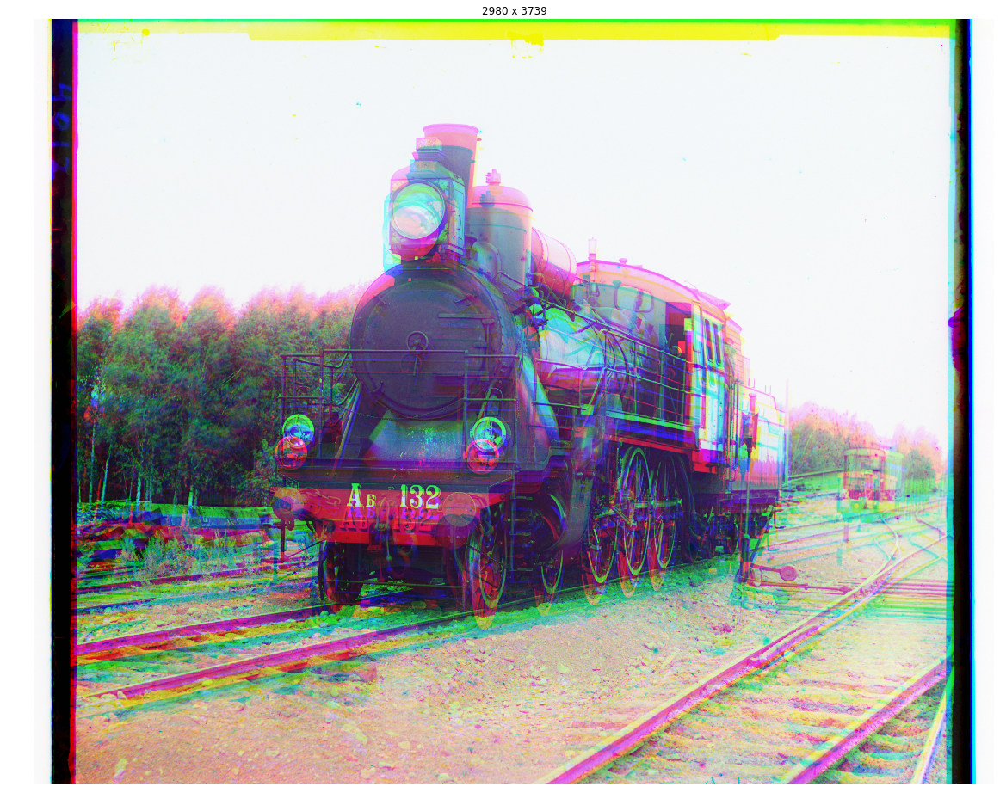

In [11]:
plt.figure(figsize=(20,20))
img_crop = remove_boundary(img_color, align_vec_g, align_vec_r)
m, n, c = img_crop.shape 
plt.title('%d x %d'%(m ,n)), 
plt.axis('off'), 
plt.imshow(img_crop)
plt.show()